## Loading Packages

In [18]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, adjusted_rand_score, silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.stats import gaussian_kde
from scipy.cluster.hierarchy import linkage, fcluster
import umap
import igraph as ig
import leidenalg
import os
import math
import fcsparser

# -------------------------------------------- #

import cellCnn
from cellCnn.utils import loadFCS, ftrans, mkdir_p, get_items
from cellCnn.model import CellCnn
from cellCnn.plotting import plot_results

# -------------------------------------------- #

import warnings
warnings.filterwarnings('ignore')


## Define WDIR and Paths

In [2]:
# Define input and output directories
WDIR = os.getcwd()
DATA_PATH = os.path.join(WDIR, 'data')
FCS_DATA_PATH = os.path.join(DATA_PATH, 'gated_NK')
DATA_LABELS_PATH = os.path.join(DATA_PATH, 'NK_fcs_samples_with_labels.csv')
MARKERS_PATH = os.path.join(DATA_PATH, 'NK_markers.csv')
OUTPUT_PATH = os.path.join(WDIR, 'output')
PLOT_PATH = os.path.join(OUTPUT_PATH, 'plots')

## Load Data Subsampling and Scaling

In [27]:
# Load fcs file labels
labels = pd.read_csv(DATA_LABELS_PATH)

markers = ['CD3', 'CD27', 'CD19', 'CD4', 'CD8', 'CD57', '2DL1-S1', 'TRAIL', '2DL2-L3-S2',
           'CD16', 'CD10', '3DL1-S1', 'CD117', '2DS4', 'ILT2-CD85j', 'NKp46', 'NKG2D',
           'NKG2C', '2B4', 'CD33', 'CD11b', 'NKp30', 'CD122', '3DL1', 'NKp44', 'CD127', '2DL1',
           'CD94', 'CD34', 'CCR7', '2DL3', 'NKG2A', 'HLA-DR', '2DL4', 'CD56', '2DL5', 'CD25']
    
# Load FCS data and add labels to the data for every file from the labels file 
def load_fcs_data(fcs_folder, labels, subsample_size=500):
    data_list = []
    for filename in os.listdir(fcs_folder):
        if filename.endswith(".fcs"):
            path = os.path.join(fcs_folder, filename)
            meta, data = fcsparser.parse(path)
            data['filename'] = filename
            data['label'] = labels[labels['fcs_filename'] == filename]['label'].values[0]
            if len(data) > subsample_size:
                data = data.sample(n=subsample_size, random_state=42, ignore_index=True)
            data_list.append(data)
    
    concat = pd.concat(data_list)
    labels = concat['label']
    data = concat.drop(['filename', 'label'], axis=1)
    data = data[markers]

    # scaler = StandardScaler()
    # subsample_scaled = scaler.fit_transform(data)

    subsample_scaled = np.arcsinh(1. / 5 * data)

    return subsample_scaled, labels

In [28]:
# Random sampling without replacement
X_10k, y_10k = load_fcs_data(FCS_DATA_PATH, labels, subsample_size=500)
X_20k, y_20k = load_fcs_data(FCS_DATA_PATH, labels, subsample_size=1000)
X_50k, y_50k = load_fcs_data(FCS_DATA_PATH, labels, subsample_size=2500)

# For Expr. level projections 
data_10k = pd.DataFrame(X_10k, columns=markers)
data_20k = pd.DataFrame(X_20k, columns=markers)
data_50k = pd.DataFrame(X_50k, columns=markers)

## EDA

In [14]:
def _save_hist_plots(data: pd.DataFrame, select_markers, markers_per_grid=10, cap_outliers=True):
    num_markers = len(select_markers)
    num_grids = math.ceil(num_markers / markers_per_grid)
    
    # Prepare to collect all data_log arrays and counts for global limits
    all_data_log = []
    all_counts = []
    
    # Collect data and compute histograms for global limits
    for marker in select_markers:
        # Handle outliers by capping extreme values
        if cap_outliers:
            data_capped = np.clip(
                data[marker],
                a_min=np.percentile(data[marker], 1),
                a_max=np.percentile(data[marker], 99)
            )
        else:
            data_capped = data[marker]
        
        # Log-transform the intensity values
        data_log = np.log1p(data_capped)
        all_data_log.append(data_log)
        
        # Compute histogram counts for y-axis limits
        counts, _ = np.histogram(data_log, bins=70)
        all_counts.append(counts)
    
    # Compute global x and y limits
    global_x_min = min([d.min() for d in all_data_log])
    global_x_max = max([d.max() for d in all_data_log])
    x_margin = (global_x_max - global_x_min) * 0.05  # Add margin to x-limits
    global_x_min -= x_margin
    global_x_max += x_margin
    
    global_y_min = 1  # Since we are using log scale, start from 1
    global_y_max = max([counts.max() for counts in all_counts])
    
    # Process grids
    for grid_num in range(num_grids):
        start_idx = grid_num * markers_per_grid
        end_idx = min((grid_num + 1) * markers_per_grid, num_markers)
        markers_subset = select_markers[start_idx:end_idx]
        data_log_subset = all_data_log[start_idx:end_idx]
        
        num_subplots = len(markers_subset)
        rows = math.ceil(num_subplots / 5)
        cols = min(num_subplots, 5)
        
        # Create a figure
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3), constrained_layout=True)
        axes = axes.flatten()
        
        # Plot each marker in the subset
        for idx, (marker, data_log) in enumerate(zip(markers_subset, data_log_subset)):
            ax = axes[idx]
            
            # Plot histogram with KDE
            sns.histplot(
                data_log,
                bins=70,
                kde=True,
                kde_kws={'bw_adjust': 0.8},
                color='blue',
                alpha=0.4,
                ax=ax
            )
            ax.lines[0].set_color('crimson')
            ax.lines[0].set_linewidth(3)

            # Set consistent x and y limits
            ax.set_xlim(global_x_min, global_x_max)
            ax.set_ylim(global_y_min, global_y_max)
            ax.set_yscale('log')
            
            # Add statistical annotation
            mean_intensity = data_log.mean()
            
            # Add vertical lines for statistics
            ax.axvline(mean_intensity, color='crimson', linestyle='--', linewidth=1)
            
            # Add annotations
            y_text_pos = global_y_max * 0.5 # starting position for text
            ax.text(mean_intensity + 0.1, y_text_pos, f'Mean: {mean_intensity:.2f}', color='red', ha='left')
            
            # Set titles and labels
            ax.set_title(marker)
            ax.set_xlabel('Log(Intensity)')
            ax.set_ylabel('Log(Frequency)')
        
        # Remove any unused subplots
        for idx in range(len(markers_subset), len(axes)):
            fig.delaxes(axes[idx])
        
        # Set the overall title
        plt.suptitle(f'EDA Marker Expression Distribution (Grid {grid_num + 1})', fontsize=16)
        
        # Save the figure
        plot_file = os.path.join(
            PLOT_PATH,
            f'EDA_marker_expression_distribution_grid{grid_num + 1}_{int(len(data)/1000)}k.png'
        )
        plt.savefig(plot_file, dpi=300)
        plt.close(fig)  # Close the figure to free memory


In [11]:
_save_hist_plots(pd.DataFrame(X_10k, columns=markers), markers)
_save_hist_plots(pd.DataFrame(X_20k, columns=markers), markers)
_save_hist_plots(pd.DataFrame(X_50k, columns=markers), markers)

## Dimensionality Reduction

In [15]:
def plot_density(embedding, method):
    # Extract the components
    x = embedding[:, 0]
    y = embedding[:, 1]

    # Calculate the point density
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)

    # Sort points by density for better visualization
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    
    plt.figure(figsize=(10, 6))

    # Scatter plot for the points
    scatter = plt.scatter(x, y, c=z, cmap='viridis', s=5)

    # Add KDE contours
    sns.kdeplot(x=x, y=y, levels=5, color='black', linewidths=1, fill=True, alpha=0.2, bw_adjust=0.7)

    # Add colorbar
    plt.colorbar(scatter, label='Density')

    plt.title(f'{method} Plot with Density Contours on {int(len(embedding)/1000)}k Data Points ')
    plt.xlabel(f'{method} Component 1')
    plt.ylabel(f'{method} Component 2')
    plt_name = os.path.join(PLOT_PATH, f'{method}_density_contours_plot_{int(len(embedding)/1000)}k.png')
    plt.savefig(plt_name)
    plt.show()

def plot_marker_expression(tsne_embedding, data, markers, method, markers_per_grid=10, point_size=5):
    num_markers = len(markers)
    num_grids = math.ceil(num_markers / markers_per_grid)

    for grid_num in range(num_grids):
        # Determine markers for this grid
        start_idx = grid_num * markers_per_grid
        end_idx = min((grid_num + 1) * markers_per_grid, num_markers)
        markers_subset = markers[start_idx:end_idx]

        num_subplots = len(markers_subset)
        rows = math.ceil(num_subplots / 5)
        cols = min(num_subplots, 5)

        # Create a figure
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3), constrained_layout=True)
        axes = axes.flatten()

        # Iterate through markers and plot
        for idx, marker in enumerate(markers_subset):
            ax = axes[idx]

            # Get the expression levels for the marker
            expression = data[marker].values

            # Sort points by expression for better visualization
            idx_sort = expression.argsort()
            x = tsne_embedding[idx_sort, 0]
            y = tsne_embedding[idx_sort, 1]
            expr_sorted = expression[idx_sort]

            # Scatter plot
            scatter = ax.scatter(
                x,
                y,
                c=expr_sorted,
                cmap='viridis',
                s=point_size,
                alpha=0.5
            )

            # Remove axis labels for clarity
            ax.set_xticks([])
            ax.set_yticks([])

            # Set title
            ax.set_title(marker)

            # Add colorbar
            cbar = fig.colorbar(scatter, ax=ax)
            cbar.ax.tick_params(labelsize=8)

        # Remove any unused subplots
        for idx in range(len(markers_subset), len(axes)):
            fig.delaxes(axes[idx])

        # Set the overall title
        plt.suptitle(f'{method} Projections Colored by Marker Expression (Grid {grid_num + 1})', fontsize=16)

        # Save the figure
        plot_file = os.path.join(PLOT_PATH, f'{method}_marker_expression_grid{grid_num + 1}_{int(len(tsne_embedding)/1000)}k.png')
        plt.savefig(plot_file, dpi=300)
        plt.close(fig)  # Close the figure to free memory

### PCA

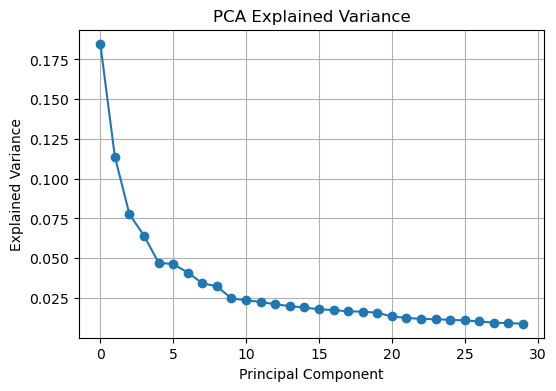

In [31]:
## plot pca variance explained by each component 
def plot_pca_variance(data, n_components=30):
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(data)

    plt.figure(figsize=(6, 4))
    plt.plot(pca.explained_variance_ratio_, marker='o')
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance')
    plt.title('PCA Explained Variance')
    plt.grid(True)
    plt.show()

plot_pca_variance(X_10k, n_components=30)

In [32]:
## get pca components with 80% variance explained
def get_pca_components(data, n_components=30, variance_threshold=0.8):
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(data)
    variance_explained = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(variance_explained)
    n_components_threshold = np.argmax(cumulative_variance >= variance_threshold) + 1
    return pca_result, n_components_threshold

pca_10k, n_components_10k = get_pca_components(X_10k, n_components=30, variance_threshold=0.8)
pca_20k, n_components_20k = get_pca_components(X_20k, n_components=30, variance_threshold=0.8)
pca_50k, n_components_50k = get_pca_components(X_50k, n_components=30, variance_threshold=0.8)

In [33]:
print(f'Number of PCA components for 80% variance explained (10k): {n_components_10k}')
print(f'Number of PCA components for 80% variance explained (20k): {n_components_20k}')
print(f'Number of PCA components for 80% variance explained (50k): {n_components_50k}')

Number of PCA components for 80% variance explained (10k): 17
Number of PCA components for 80% variance explained (20k): 17
Number of PCA components for 80% variance explained (50k): 17


In [34]:
## select only the first n_components for each dataset
X_10k_pca = pca_10k[:, :n_components_10k]
X_20k_pca = pca_20k[:, :n_components_20k]
X_50k_pca = pca_50k[:, :n_components_50k]

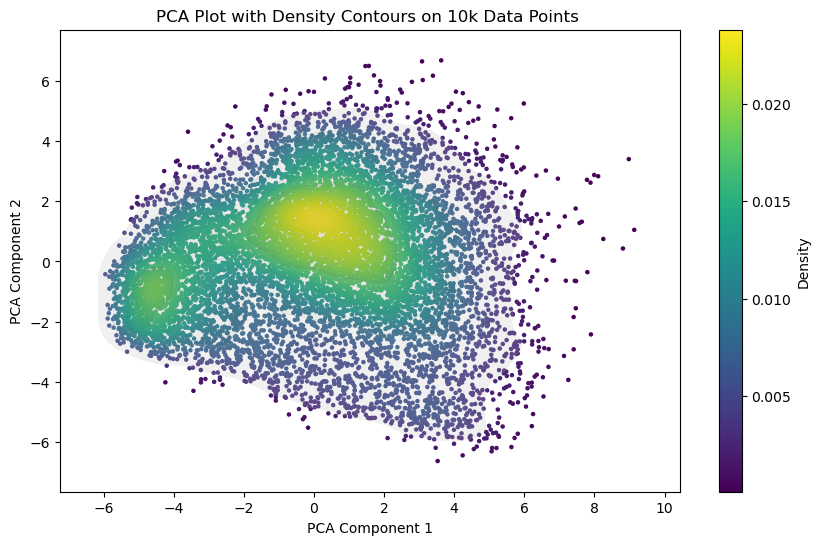

In [35]:
plot_density(embedding=X_10k_pca, method="PCA")

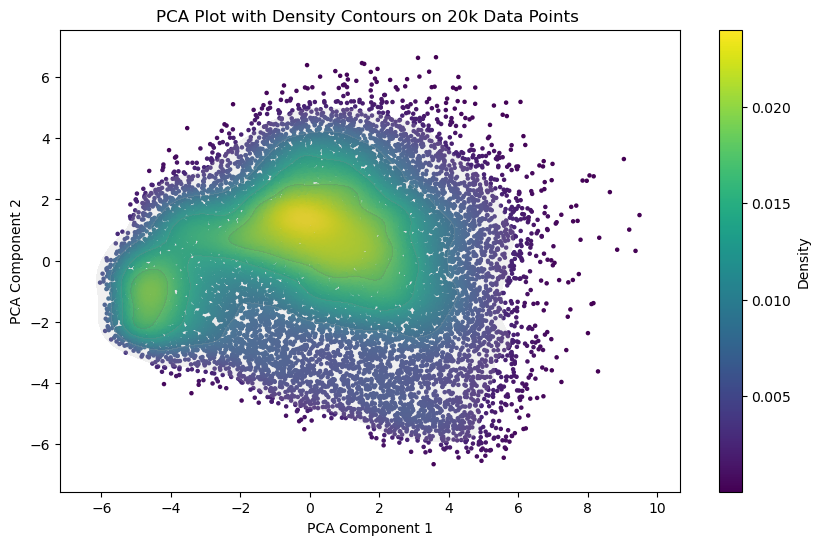

In [36]:
plot_density(embedding=X_20k_pca, method="PCA")

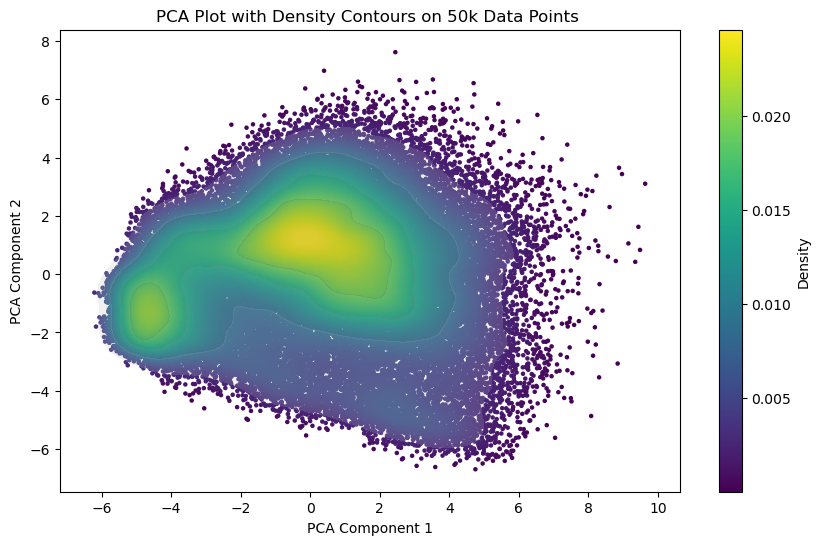

In [37]:
plot_density(embedding=X_50k_pca, method="PCA")

### t-SNE

In [38]:
def apply_tsne(data, perplexity=30, n_components=2, learning_rate=200, n_iter=1000):
    tsne = TSNE(n_components=n_components, perplexity=perplexity, learning_rate=learning_rate, n_iter=n_iter, random_state=42)
    tsne_result = tsne.fit_transform(data)
    return tsne_result

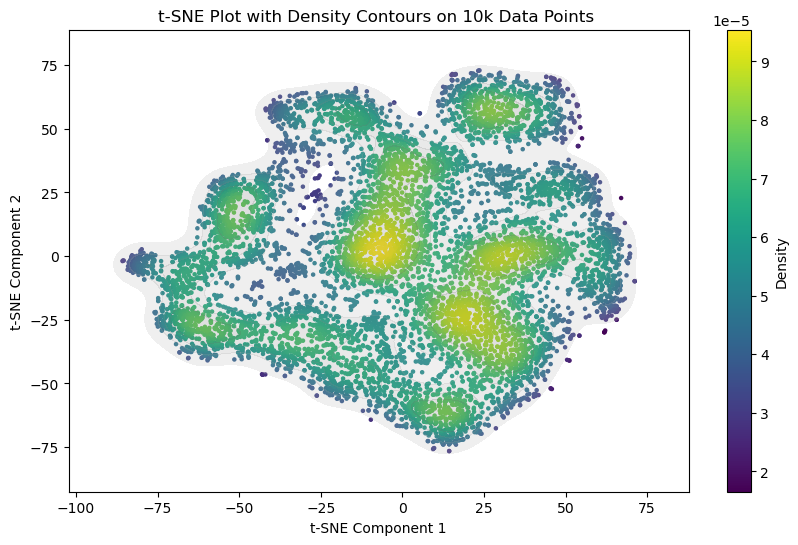

In [39]:
tsne_10k = apply_tsne(X_10k_pca)
plot_density(embedding=tsne_10k, method="t-SNE")

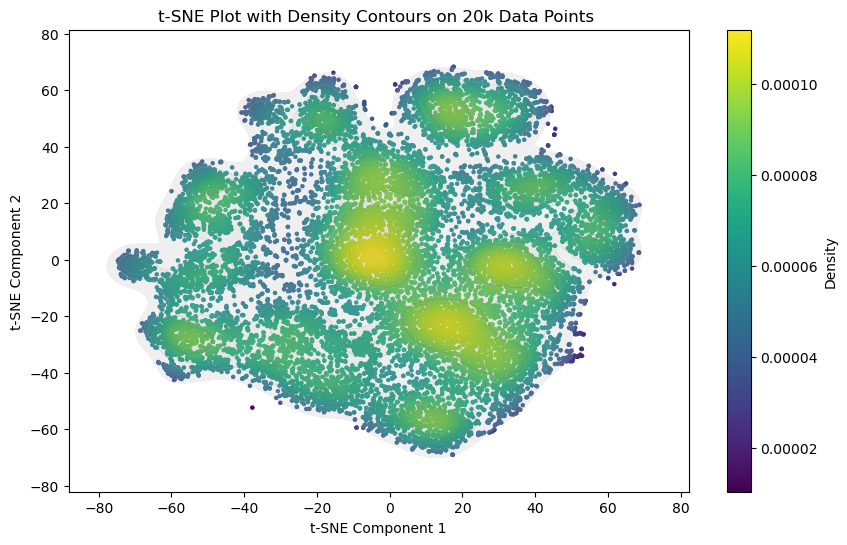

In [40]:
tsne_20k = apply_tsne(X_20k_pca)
plot_density(embedding=tsne_20k, method="t-SNE")
plot_marker_expression(tsne_embedding=tsne_20k, data=data_20k, markers=markers, method="t-SNE")

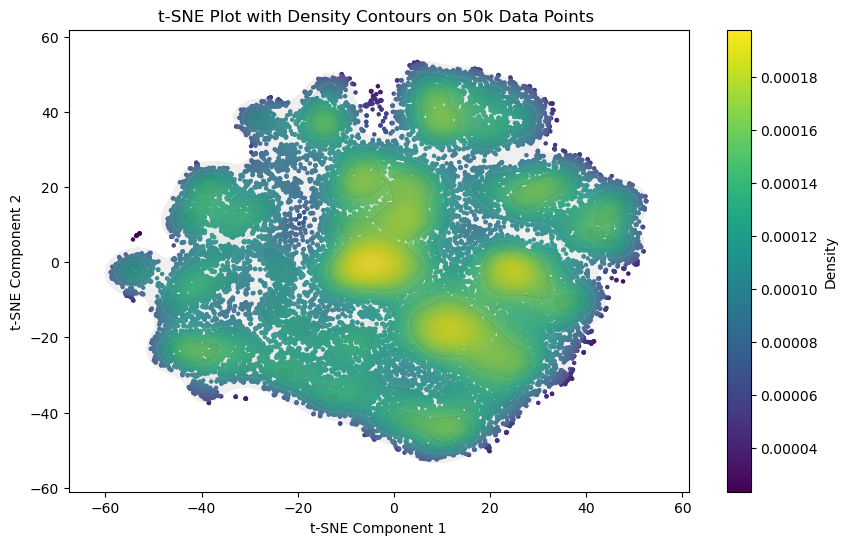

In [63]:
tsne_50k = apply_tsne(X_50k_pca)
plot_density(embedding=tsne_50k, method="t-SNE")

### UMAP

In [41]:
def apply_umap(data, n_neighbors=10, n_components=2, metric='euclidean'):
    reducer = umap.UMAP(n_neighbors=n_neighbors, n_components=n_components, metric=metric, random_state=42)
    umap_result = reducer.fit_transform(data)
    return umap_result
    

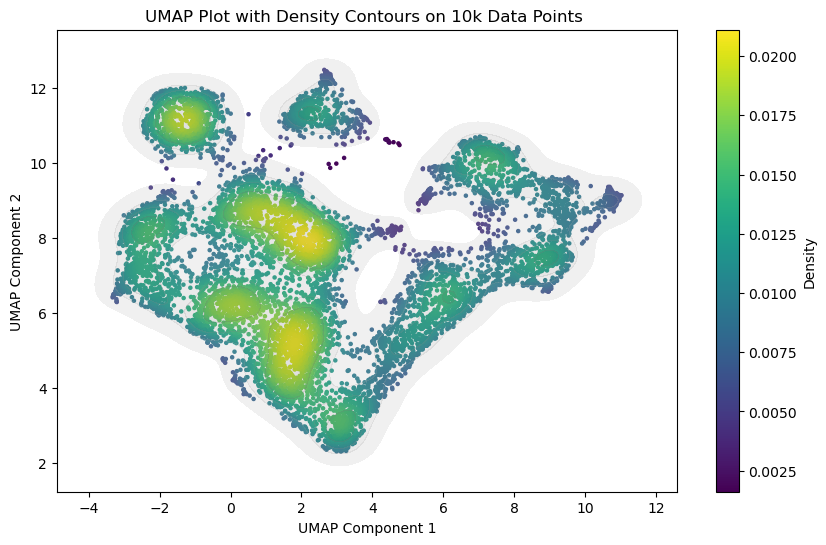

In [42]:
umap_10k = apply_umap(X_10k_pca)
plot_density(embedding=umap_10k, method="UMAP")

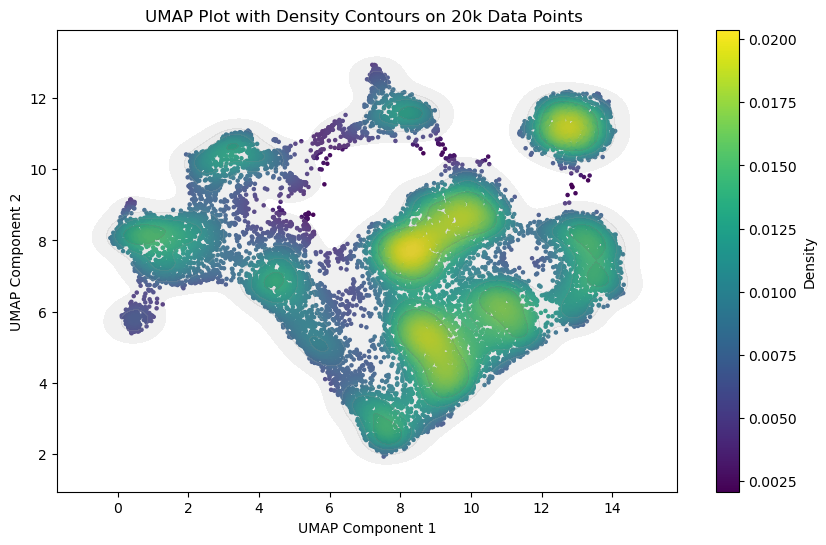

In [43]:
umap_20k = apply_umap(X_20k_pca)
plot_density(embedding=umap_20k, method="UMAP")
plot_marker_expression(tsne_embedding=umap_20k, data=data_20k, markers=markers, method="UMAP")

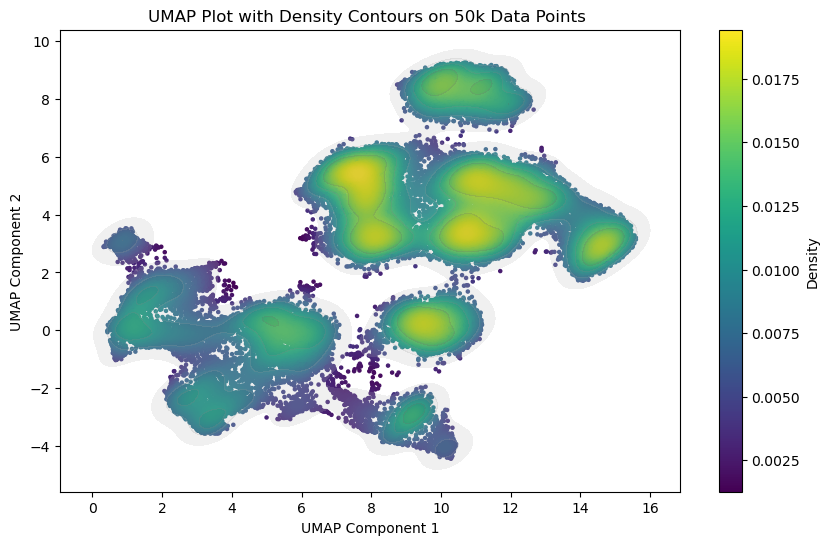

In [44]:
umap_50k = apply_umap(X_50k_pca)
plot_density(embedding=umap_50k, method="UMAP")

## Comparing the Methods

In [103]:
# # Calculate Silhouette Scores for PCA, t-SNE, and UMAP
# def calculate_silhouette(data, labels):
#     return silhouette_score(data, labels)

# # Using PCA, t-SNE, and UMAP results as labels for silhouette score
# pca_silhouette = calculate_silhouette(scaled_data, pca_result[:, 0])
# tsne_silhouette = calculate_silhouette(scaled_data, tsne_result[:, 0])
# umap_silhouette = calculate_silhouette(scaled_data, umap_result[:, 0])

# print(f"Silhouette score for PCA: {pca_silhouette}")
# print(f"Silhouette score for t-SNE: {tsne_silhouette}")
# print(f"Silhouette score for UMAP: {umap_silhouette}")


Silhouette score for PCA: -0.00048676328151486814
Silhouette score for t-SNE: -0.0005632989341393113
Silhouette score for UMAP: -0.0007580032106488943


## Clustering

In [45]:
def plot_clustering(embedding, projection_method, clustering_method, clustering_labels):
    plt.figure(figsize=(10, 8))
    plt.scatter(embedding[:, 0], embedding[:, 1], c=clustering_labels, cmap='tab20', s=5)
    plt.title(f'{clustering_method} Clustering on {projection_method} Projection of {int(len(embedding)/1000)}k Data Points')
    plt.xlabel(f'{projection_method} Component 1')
    plt.ylabel(f'{projection_method} Component 2')
    plt_title = os.path.join(PLOT_PATH, f'{clustering_method}_clustering_on_{projection_method}_{int(len(embedding)/1000)}k.png')
    plt.savefig(plt_title)
    plt.show()

### K-means

In [46]:
def apply_kmeans(data, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(data)
    return kmeans_labels

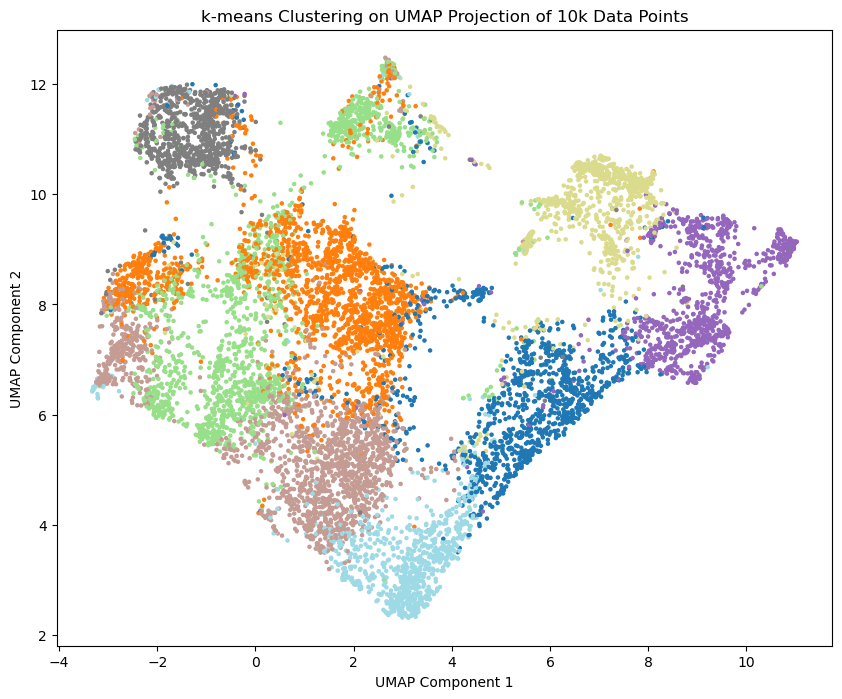

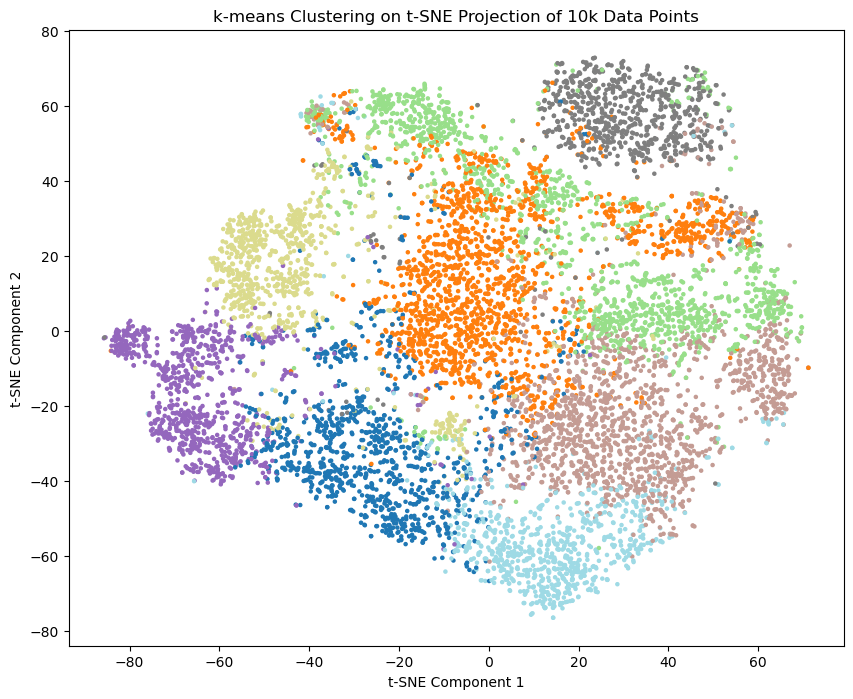

In [49]:
# Apply k-means clustering for 10k samples
kmeans_labels_10k = apply_kmeans(X_10k_pca, n_clusters=8)

plot_clustering(umap_10k, projection_method='UMAP', clustering_method="k-means", clustering_labels=kmeans_labels_10k)
plot_clustering(tsne_10k, projection_method='t-SNE', clustering_method="k-means", clustering_labels=kmeans_labels_10k)

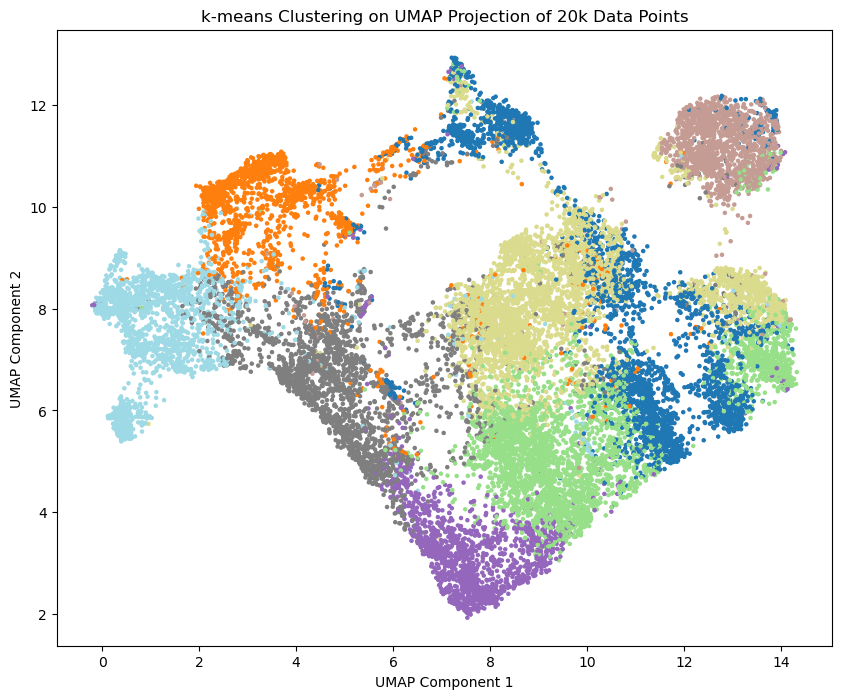

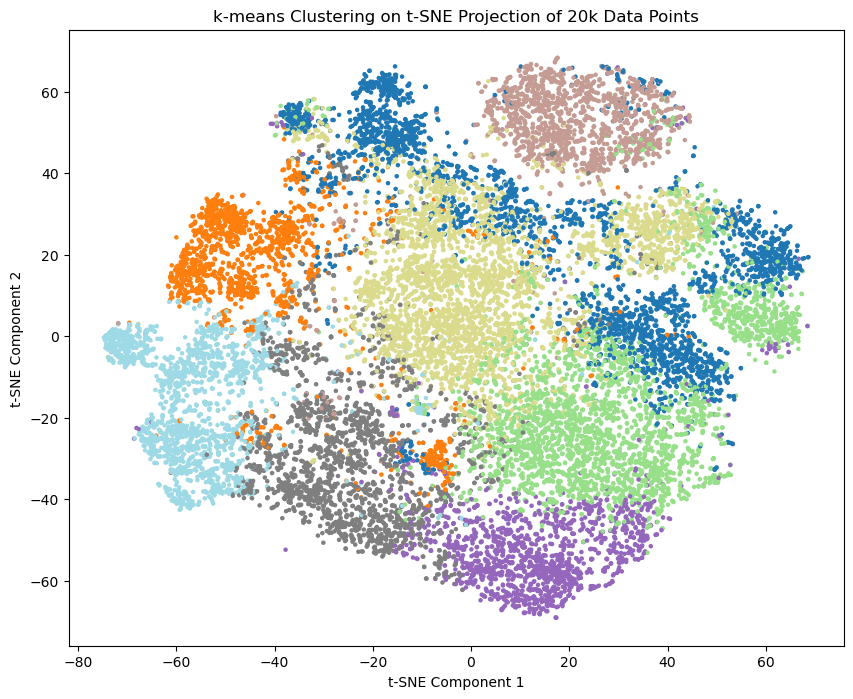

In [50]:
# Apply k-means clustering for 20k samples
kmeans_labels_20k = apply_kmeans(X_20k_pca, n_clusters=8)

plot_clustering(umap_20k, projection_method='UMAP', clustering_method="k-means", clustering_labels=kmeans_labels_20k)
plot_clustering(tsne_20k, projection_method='t-SNE', clustering_method="k-means", clustering_labels=kmeans_labels_20k)

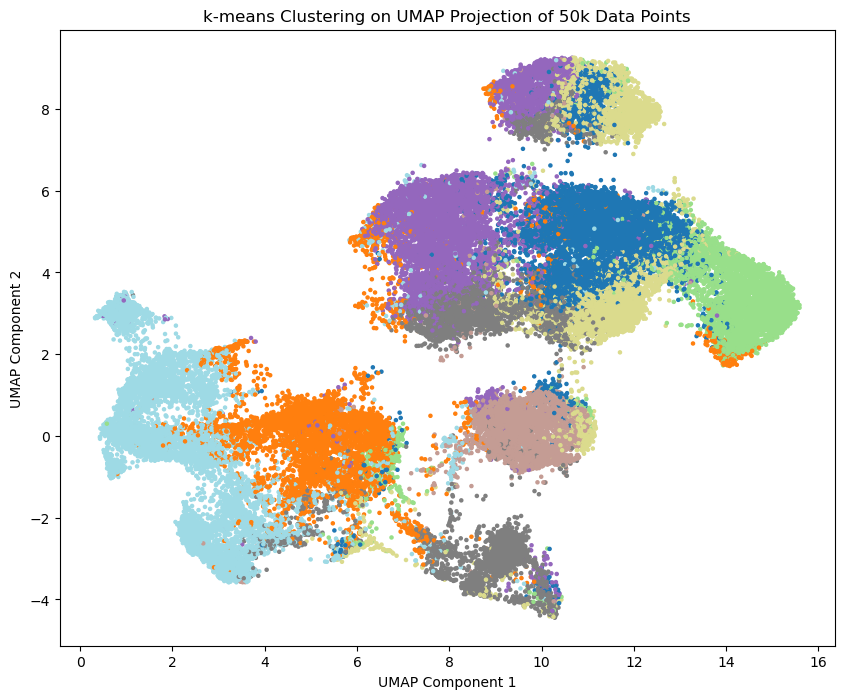

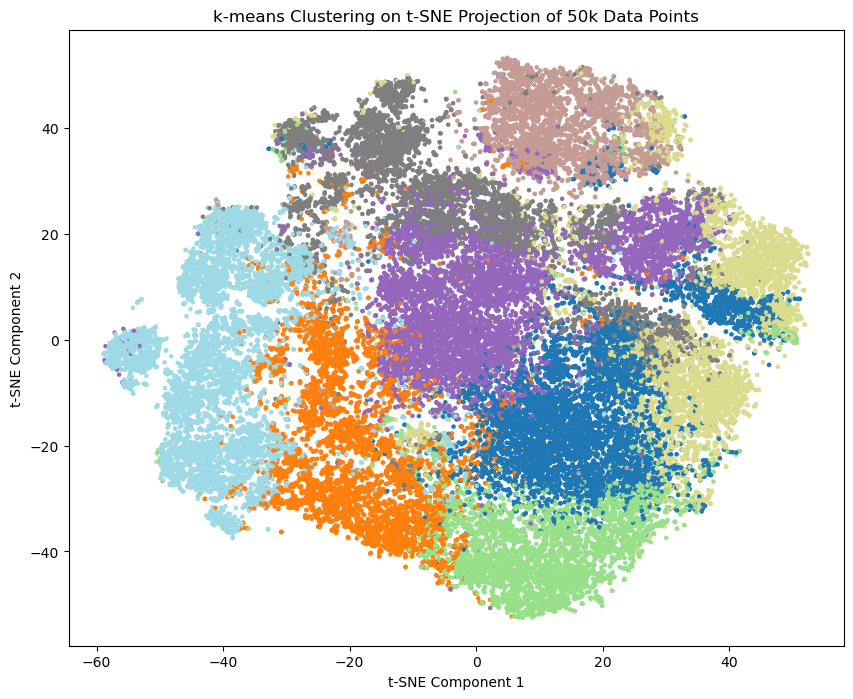

In [64]:
# Apply k-means clustering for 50k samples
kmeans_labels_50k = apply_kmeans(X_50k_pca, n_clusters=8)

plot_clustering(umap_50k, projection_method='UMAP', clustering_method="k-means", clustering_labels=kmeans_labels_50k)
plot_clustering(tsne_50k, projection_method='t-SNE', clustering_method="k-means", clustering_labels=kmeans_labels_50k)

### Hierarchical

In [52]:
def apply_hierarchical(data, n_clusters):
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    hierarchical_labels = model.fit_predict(data)
    return hierarchical_labels

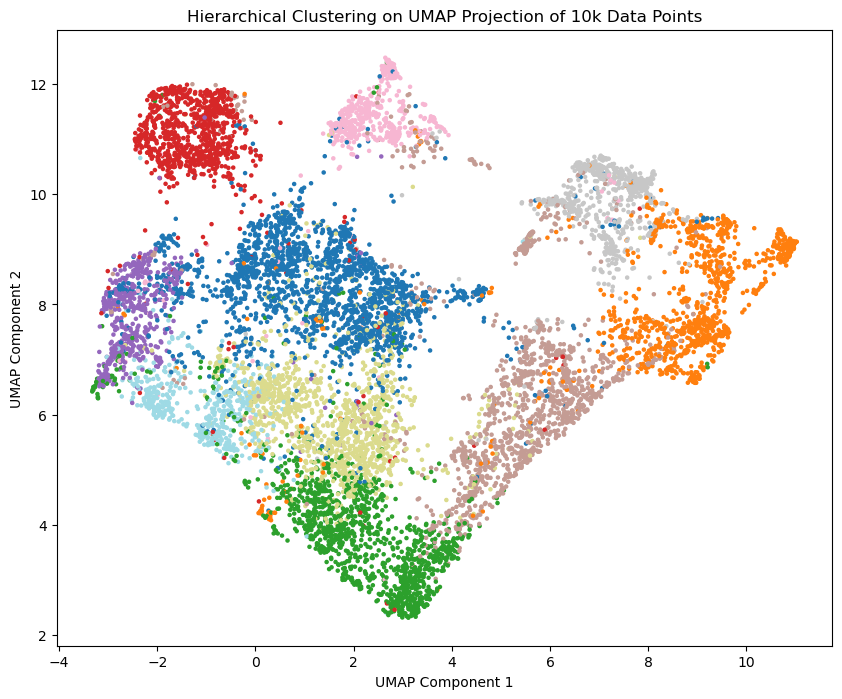

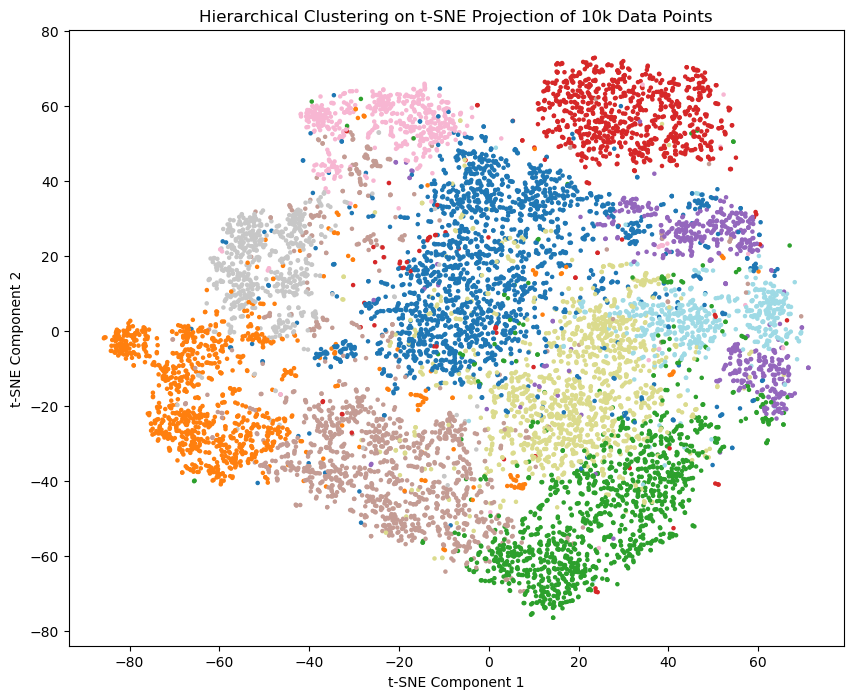

In [53]:
# Apply Hierarchical Clustering for 10k samples
hierarchical_labels_10k = apply_hierarchical(X_10k_pca, n_clusters=10)

plot_clustering(umap_10k, projection_method='UMAP', clustering_method="Hierarchical", clustering_labels=hierarchical_labels_10k)
plot_clustering(tsne_10k, projection_method='t-SNE', clustering_method="Hierarchical", clustering_labels=hierarchical_labels_10k)


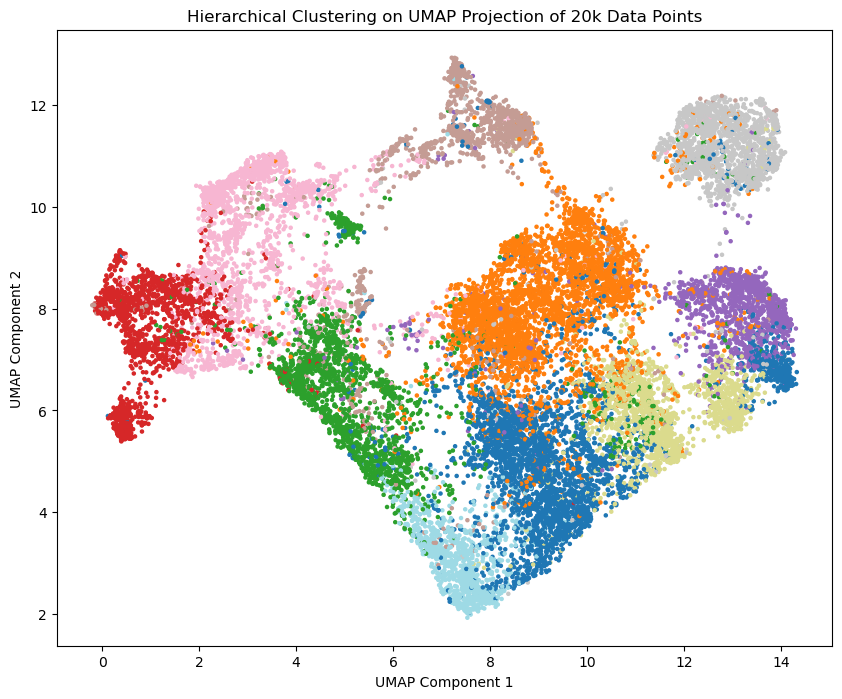

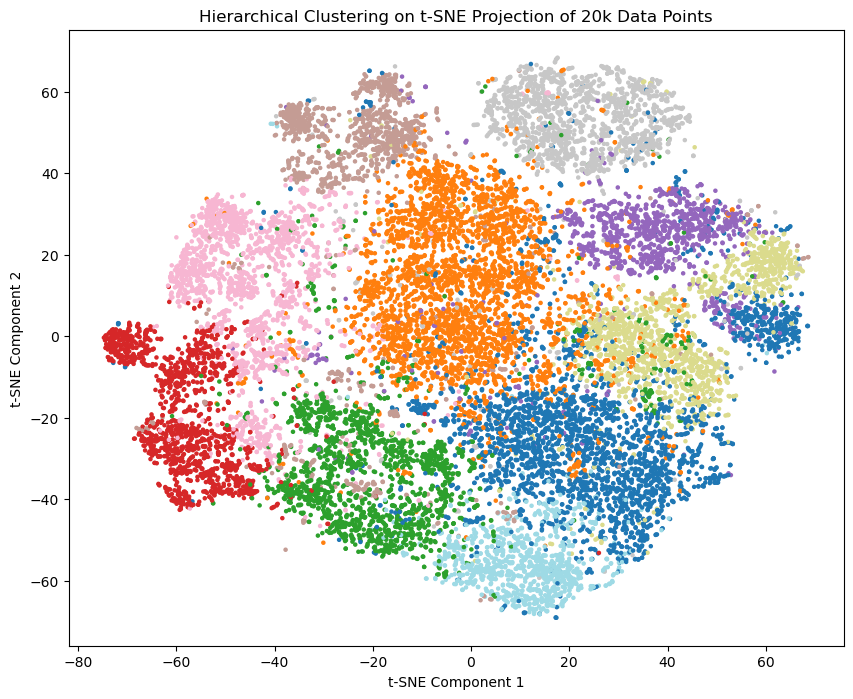

In [54]:
# Apply Hierarchical Clustering for 20k samples
hierarchical_labels_20k = apply_hierarchical(X_20k_pca, n_clusters=10)

plot_clustering(umap_20k, projection_method='UMAP', clustering_method="Hierarchical", clustering_labels=hierarchical_labels_20k)
plot_clustering(tsne_20k, projection_method='t-SNE', clustering_method="Hierarchical", clustering_labels=hierarchical_labels_20k)


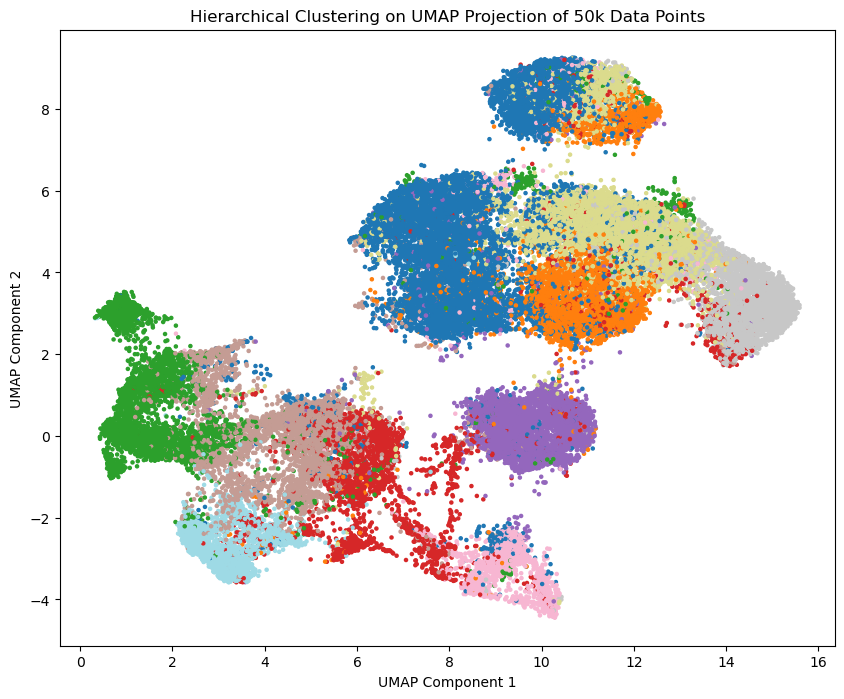

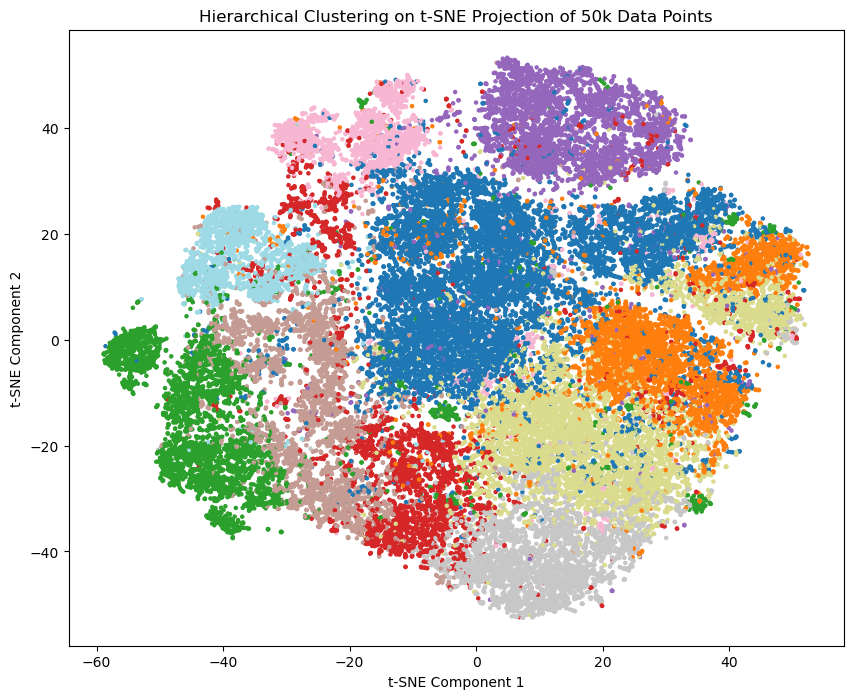

In [65]:
# Apply Hierarchical Clustering for 50k samples
hierarchical_labels_50k = apply_hierarchical(X_50k_pca, n_clusters=10)

plot_clustering(umap_50k, projection_method='UMAP', clustering_method="Hierarchical", clustering_labels=hierarchical_labels_50k)
plot_clustering(tsne_50k, projection_method='t-SNE', clustering_method="Hierarchical", clustering_labels=hierarchical_labels_50k)

### Leiden

In [59]:
def apply_leiden(embedding, n_neighbors = 10):
    ## construct k-NN Graph
    knn = NearestNeighbors(n_neighbors=n_neighbors)
    knn.fit(embedding)
    knn_graph = knn.kneighbors_graph(embedding, mode='connectivity')
    
    ## apply leiden on constructed graph
    sources, targets = knn_graph.nonzero()
    edges = list(zip(sources, targets))
    g = ig.Graph(edges=edges, directed=False)
    weights = knn_graph.data
    g.es['weight'] = weights

    partition = leidenalg.find_partition(
        g,
        leidenalg.RBConfigurationVertexPartition,
        weights=g.es['weight'],
        resolution_parameter=0.6
    )
    leiden_labels = np.array(partition.membership)

    return leiden_labels


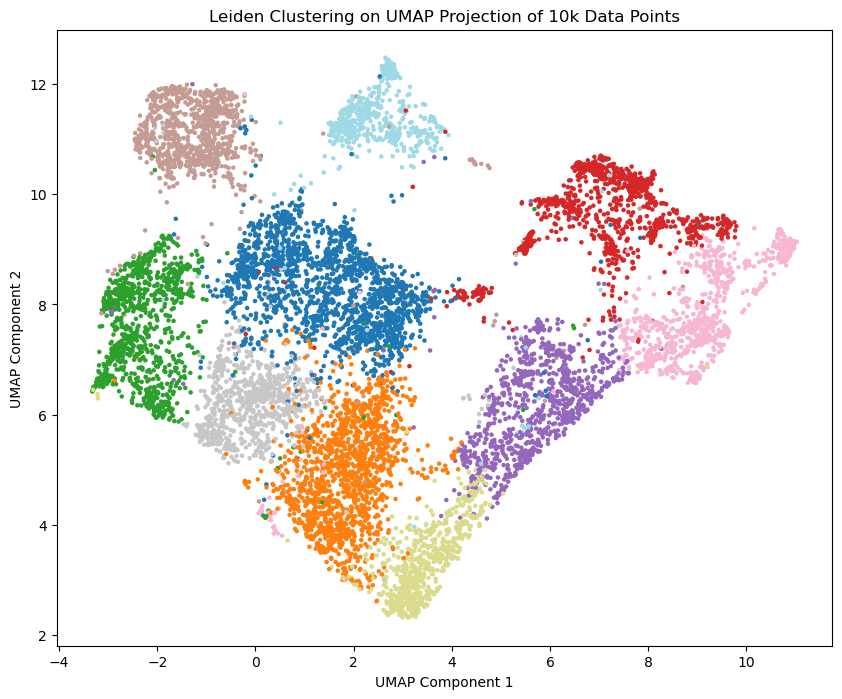

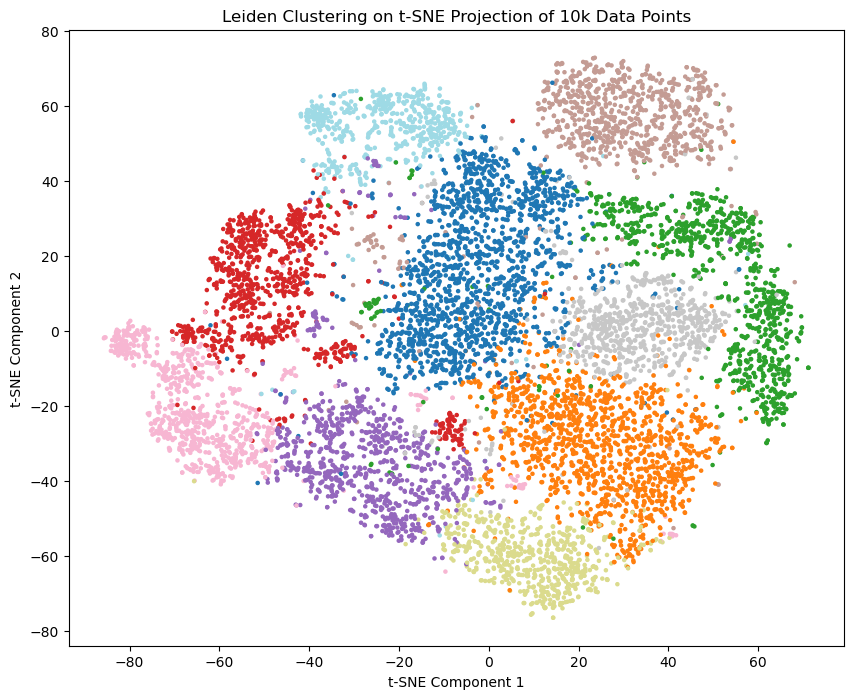

In [60]:
# Apply Leiden Clustering for 10k Samples 
leiden_labels_10k = apply_leiden(X_10k_pca)

plot_clustering(umap_10k, projection_method='UMAP', clustering_method="Leiden", clustering_labels=leiden_labels_10k)
plot_clustering(tsne_10k, projection_method='t-SNE', clustering_method="Leiden", clustering_labels=leiden_labels_10k)

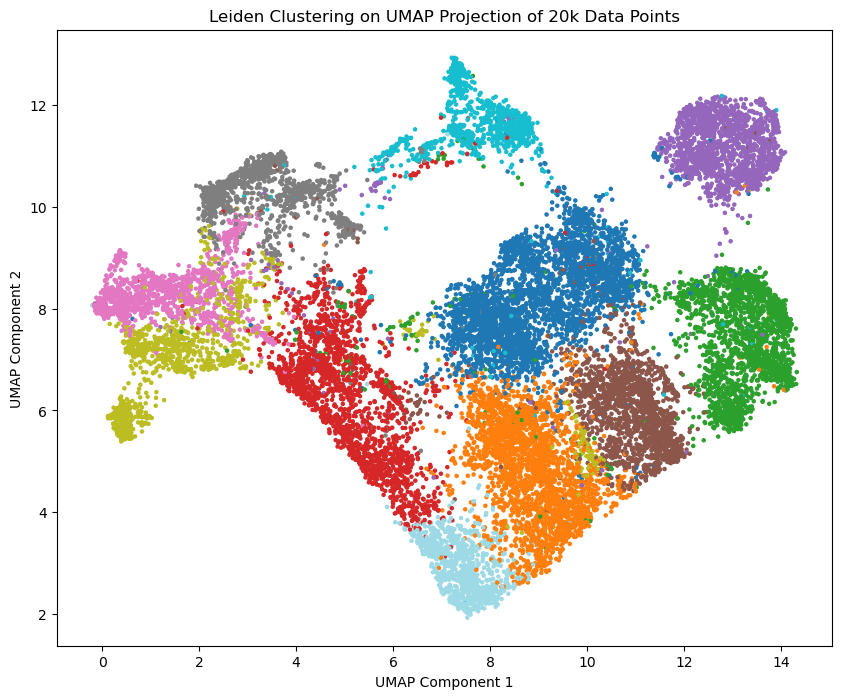

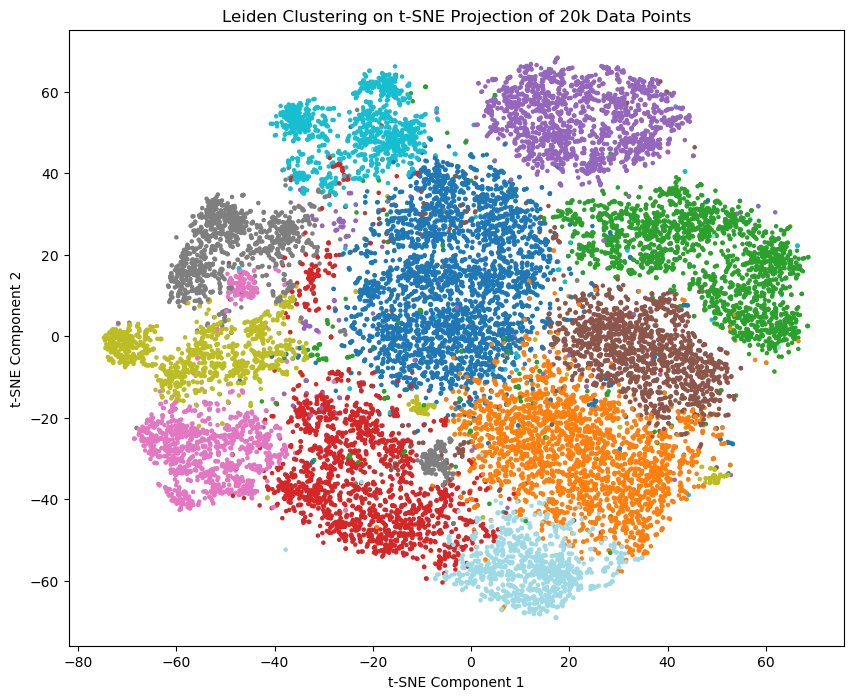

In [61]:
# Apply Leiden Clustering for 20k Samples 
leiden_labels_20k = apply_leiden(X_20k_pca)

plot_clustering(umap_20k, projection_method='UMAP', clustering_method="Leiden", clustering_labels=leiden_labels_20k)
plot_clustering(tsne_20k, projection_method='t-SNE', clustering_method="Leiden", clustering_labels=leiden_labels_20k)


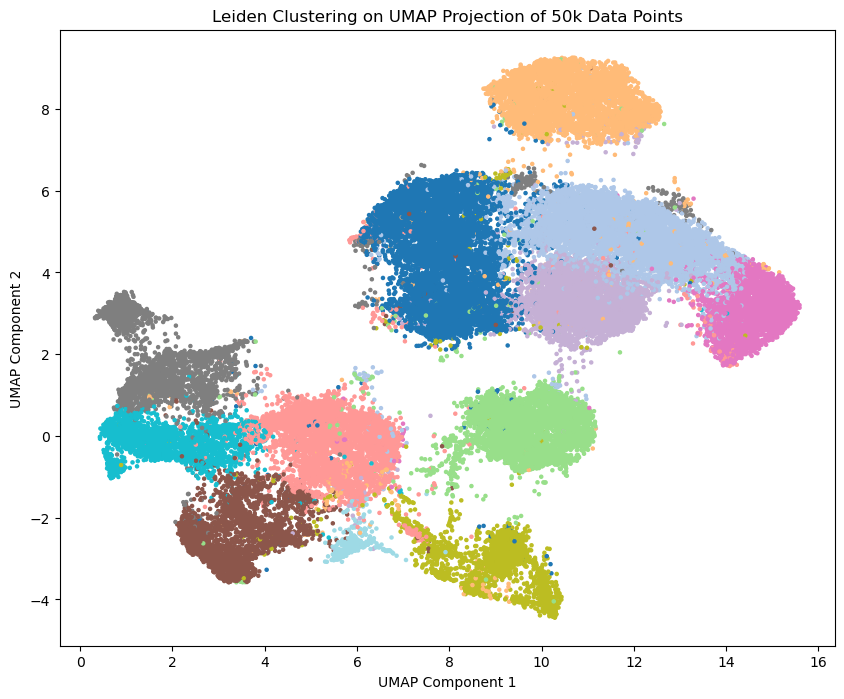

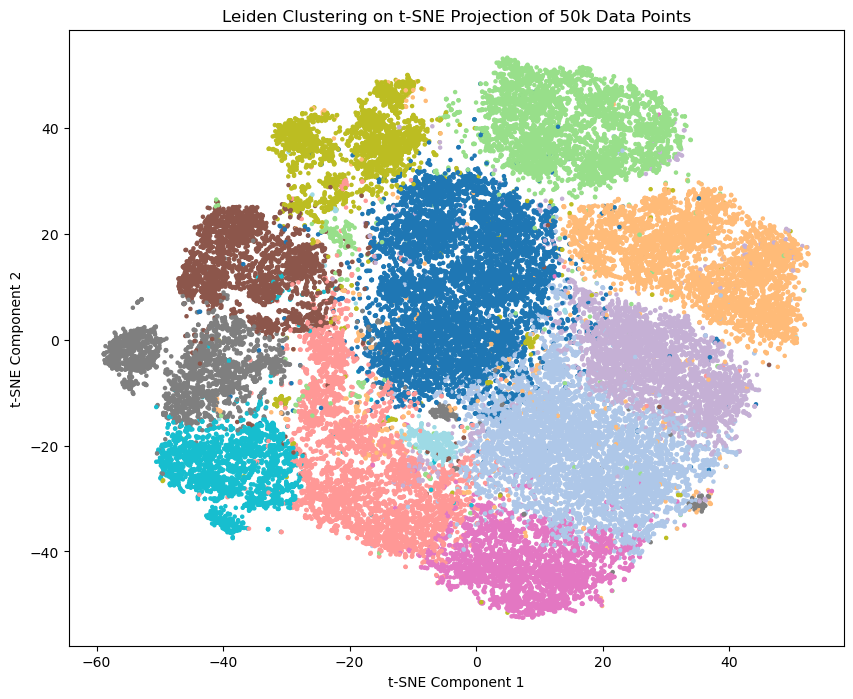

In [66]:
# Apply Leiden Clustering for 50k Samples 
leiden_labels_50k = apply_leiden(X_50k_pca)

plot_clustering(umap_50k, projection_method='UMAP', clustering_method="Leiden", clustering_labels=leiden_labels_50k)
plot_clustering(tsne_50k, projection_method='t-SNE', clustering_method="Leiden", clustering_labels=leiden_labels_50k)

### Comparing the Methods

In [67]:
## Compare the methods performance using ARI
def calculate_ari(true_labels, predicted_labels):
    return adjusted_rand_score(true_labels, predicted_labels)

# Calculate ARI for k-means clustering
ari_kmeans_10k = calculate_ari(y_10k, kmeans_labels_10k)
ari_kmeans_20k = calculate_ari(y_20k, kmeans_labels_20k)
ari_kmeans_50k = calculate_ari(y_50k, kmeans_labels_50k)


# Calculate ARI for hierarchical clustering
ari_hierarchical_10k = calculate_ari(y_10k, hierarchical_labels_10k)
ari_hierarchical_20k = calculate_ari(y_20k, hierarchical_labels_20k)
ari_hierarchical_50k = calculate_ari(y_50k, hierarchical_labels_50k)

# Calculate ARI for Leiden clustering
ari_leiden_10k = calculate_ari(y_10k, leiden_labels_10k)
ari_leiden_20k = calculate_ari(y_20k, leiden_labels_20k)
ari_leiden_50k = calculate_ari(y_50k, leiden_labels_50k)

print(f"ARI for k-means clustering (10k): {ari_kmeans_10k}")
print(f"ARI for k-means clustering (20k): {ari_kmeans_20k}")
print(f"ARI for k-means clustering (50k): {ari_kmeans_50k}")

print(f"ARI for hierarchical clustering (10k): {ari_hierarchical_10k}")
print(f"ARI for hierarchical clustering (20k): {ari_hierarchical_20k}")
print(f"ARI for hierarchical clustering (50k): {ari_hierarchical_50k}")

print(f"ARI for Leiden clustering (10k): {ari_leiden_10k}")
print(f"ARI for Leiden clustering (20k): {ari_leiden_20k}")
print(f"ARI for Leiden clustering (50k): {ari_leiden_50k}")

ARI for k-means clustering (10k): 0.009142990595971496
ARI for k-means clustering (20k): 0.009966904764664596
ARI for k-means clustering (50k): 0.010634128840375812
ARI for hierarchical clustering (10k): 0.01693002308983278
ARI for hierarchical clustering (20k): 0.0172337025991156
ARI for hierarchical clustering (50k): 0.014518480879878058
ARI for Leiden clustering (10k): 0.01927277575498245
ARI for Leiden clustering (20k): 0.018737098446150784
ARI for Leiden clustering (50k): 0.018674319035969233
